# One image classification example

Here we show the classification process on an example of one image.

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
# importing the necessary packages
import sys
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt # for plotting
from matplotlib.lines import Line2D # for creating plot legend
import tifffile as tiff # for reading tiff images

from skimage.segmentation import mark_boundaries
from tqdm.notebook import tqdm # for the beautiful progress-bars
from myfunctions import *

In [3]:
IMAGE_NAME = "NO_SVB_SAST_MSP_20180801"
PATH_ORIGINAL_IMAGES = "../../../Nextcloud2/" # the folder with all the images
MSP_FOLDER = "./data/drone_msp_numpy/" # the folder with preprocessed MSP images
PATH_ONE_IMAGE = './data/One_image_example/' # the folder with MSP and RGB data for this example
PATH_LABELS = "./data/labels_MSP_4classes.csv" # the file with labelled points
PATH_META_LANDCOVER = "./data/msp_meta_landcover.csv"
PATH_RESULT_JPG = "./data/MSP_masks_jpg/"
PATH_RESULT_MSP = './data/MSP_masks_tiff/'

# Creating the ou tput directories if they do not exist
if not os.path.exists(PATH_RESULT_MSP):  
    os.mkdir(PATH_RESULT_MSP)
if not os.path.exists(PATH_RESULT_JPG):  
    os.mkdir(PATH_RESULT_JPG)

In [4]:
drfiles = []
for path, subdirs, files in os.walk(PATH_ORIGINAL_IMAGES):
    for name in files:
        drfiles = drfiles + [os.path.join(path, name)]
grefiles = [drfiles[i] for i in range(len(drfiles)) if any(x in drfiles[i] for x in ["_nir"])]
grefiles = np.array(grefiles)

## Preparing data

### 1. Loading the image

We load the multispectral (MSP) image with 4 bands: red, green, REG and NIR. Here is the image dimantions:

In [5]:
## Reading out an image and calculating the indexes
name_im = IMAGE_NAME + "_msp.npy"
msp_names = names_in_folder(name_im, MSP_FOLDER)
msp = np.load(MSP_FOLDER + msp_names[0]) # reading out preprocessed image
msp3 = image_minmax(msp[:,:,[3,0,1]]) # creating falsecolor image (NIR, red, green)
msp.shape

(3078, 3079, 4)

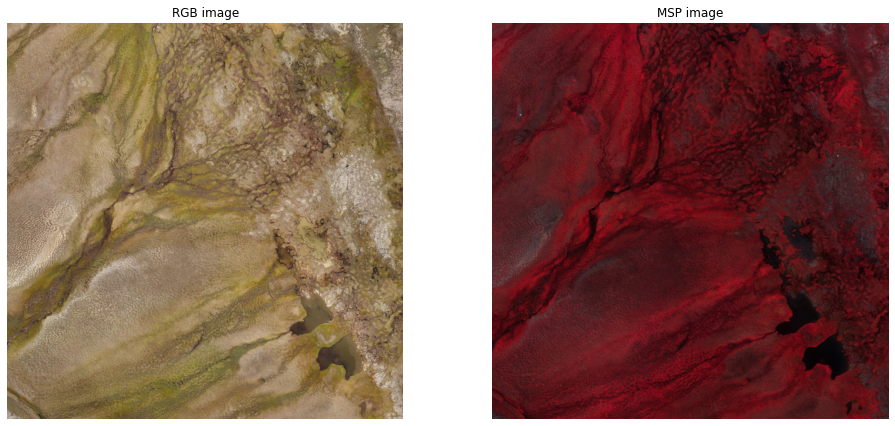

In [6]:
im = tiff.imread(PATH_ONE_IMAGE + IMAGE_NAME.replace("MSP", "RGB") + "_rgb.tif")
plot_2images(image_minmax(im),msp3, titles = ["RGB image", "MSP image"])

We further work with MSP image, as RGB and MSP images are not well-alligned, and MSP image contains more information relevant for classification (e.g. NIR band).

### 2. Calculating indexes for classification

In [7]:
featurenames = ["ndvi", "nir_r", "sumb","r","nir","g", "reg"]
dim = calculating_features(msp, featurenames)
showdim = dim.values
showdim = showdim.reshape((msp.shape[0],msp.shape[1], 7))

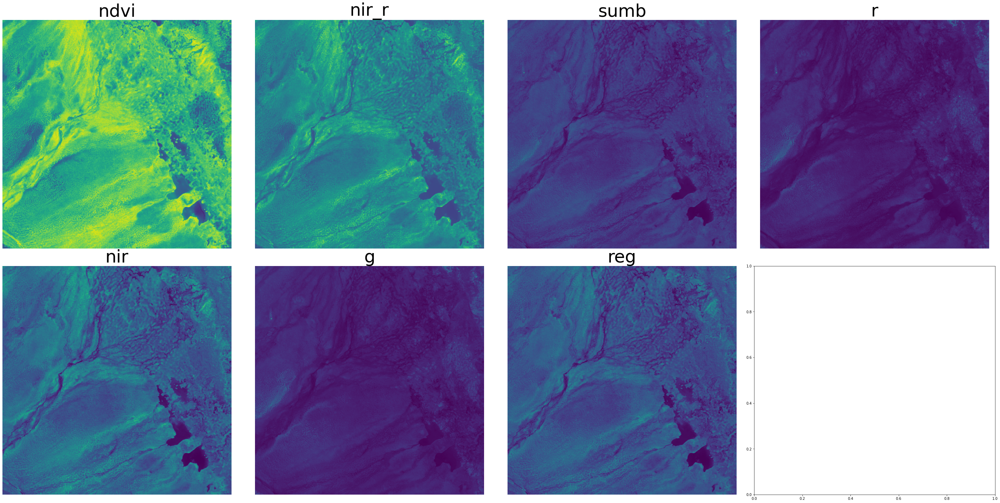

In [8]:
plot_features(showdim, featurenames)

### 3. Metadata on landcover

In [54]:
# Reading the metadata about whether soil, water or snow are present on the picture 
df = pd.read_csv(PATH_META_LANDCOVER, index_col=0)
dark_imgs = df.name[df.dark_image == 1] # Listing dark images
df[22:].head()

,name,soil,water,snow,const_water,const_soil,dark_image
22,NO_SVB_JANW_MSP_20180720,1,0,1,0.00,0.0,0
23,NO_SVB_JASE_MSP_20180720,1,0,1,0.00,0.0,0
24,NO_SVB_SASO_MSP_20180801,1,1,0,0.80,0.5,0
25,NO_SVB_SAST_MSP_20180801,1,1,0,0.15,0.0,0
26,NO_SVB_TODA_MSP_20180723,1,1,0,0.10,0.0,0


### 4. Loading labels

We load the table that we generated using the [MakeSenseAI tool](https://www.makesense.ai/) for labeling. 

In [10]:
# Reading out the labelled points (training data)
labdat = pd.read_csv(PATH_LABELS, header = None)
labdat = labdat[[3,0,2,1]]
labdat.columns = ["imname", "label", "x", "y"]
labdat["imname"] = [x.split("_false")[0] for x in labdat.imname.values]
labdat["region"] = [x.split("_")[1] for x in labdat.imname.values]
# Putting dark images in separate regions
labdat.loc[np.isin(labdat.imname,dark_imgs), "region"] = labdat.region[np.isin(labdat.imname,dark_imgs)] + "_dark"
labdat.head(5)

,imname,label,x,y,region
0,US_ALK_UTC2_MSP_20180729,vegetation,3303,1154,ALK
1,US_ALK_UTC2_MSP_20180729,vegetation,2939,1970,ALK
2,US_ALK_UTC2_MSP_20180729,vegetation,3191,2024,ALK
3,US_ALK_UTC2_MSP_20180729,vegetation,1613,1101,ALK
4,US_ALK_UTC2_MSP_20180729,vegetation,2842,863,ALK


Here is how our training data look on the image. The blue dots stand for water, green - vegetation and orange - soil.

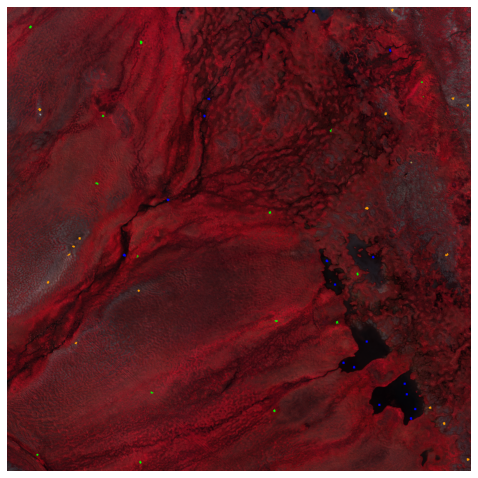

In [49]:
from myfunctions import *
#img, segm, centers_norm = slic_segm(msp3, n_segments=50000, compactness = 8) # Segmenting the image
sl = labdat[labdat.imname == IMAGE_NAME].copy()
sl["segnum"] = segm[sl.x, sl.y]
plot_training_sample(msp3, sl, segm)

### 5. Preparing training data

Here, we merge the table of labels with all the raw band values for each location. We then calculate the following indexes:
NDVI, difference between NIR and R, and the sum of all bands.

In [12]:
train_imnames = np.unique(labdat["imname"])
# Normalizing each image to its 99th percentile
for name_im_loc in tqdm(train_imnames):
    msp_names_loc = names_in_folder(name_im_loc, MSP_FOLDER)
    msp_loc = np.load(MSP_FOLDER + msp_names_loc[0])
    inds_im = labdat.imname == name_im_loc
    labdat.loc[inds_im, ["r","g", "reg", "nir"]] = msp_loc[labdat[inds_im].x, \
                                                           labdat[inds_im].y, :]/np.quantile(msp_loc, 0.99)
    
# Calculating the indexes
labdat["ndvi"] = (labdat["nir"] - labdat["r"])/(labdat["nir"] + labdat["r"])
labdat["nir_r"] = labdat["nir"] - labdat["r"]
labdat["sumb"] = labdat["nir"] + labdat["r"] + labdat["r"]
labdat.head(5)

  0%|          | 0/42 [00:00<?, ?it/s]

,imname,label,x,y,region,r,g,reg,nir,ndvi,nir_r,sumb
0,US_ALK_UTC2_MSP_20180729,vegetation,3303,1154,ALK,0.113352,0.117228,0.415786,0.829062,0.759443,0.715710,1.055766
1,US_ALK_UTC2_MSP_20180729,vegetation,2939,1970,ALK,0.136927,0.160439,0.443939,0.904373,0.737007,0.767445,1.178227
2,US_ALK_UTC2_MSP_20180729,vegetation,3191,2024,ALK,0.117405,0.130250,0.355026,0.686701,0.707985,0.569295,0.921511
3,US_ALK_UTC2_MSP_20180729,vegetation,1613,1101,ALK,0.202328,0.208780,0.517920,0.981910,0.658299,0.779582,1.386566
4,US_ALK_UTC2_MSP_20180729,vegetation,2842,863,ALK,0.194401,0.175558,0.415363,0.784497,0.602816,0.590096,1.173300


In [13]:
## Getting information abot the image
regim = name_im.split("_")[1] # determining the region of the image
nam = name_im.split("_msp")[0]
metadat = df[df.name == nam]
if metadat.dark_image.item() == 1:
    regim = regim + "_dark"

For example, here is how the separation between classess look like in the NDVI vs. "Sum of all bands" coordinates. On the left - for all the images, on the right - for the current image.

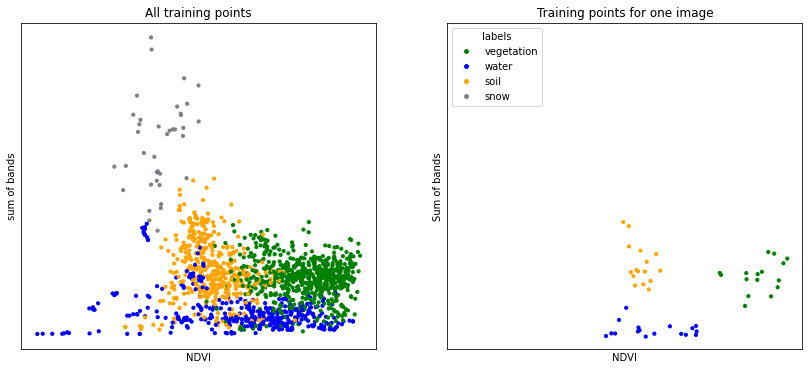

In [14]:
coldict = {"vegetation": "green", "soil": "orange", "water": "blue", "snow": "grey"}
labdat["col"] = list(map(coldict.get, labdat.label.values))

fig = plt.figure(figsize = (14,6))
plt.subplot(1, 2, 1)
plt.scatter(labdat.ndvi, labdat.sumb, c = labdat.col, s = 10)
plt.xticks([])
plt.xlabel("NDVI")
plt.yticks([])
plt.ylabel("sum of bands")
plt.title("All training points") 


name_im = IMAGE_NAME
#labdat.label[labdat.imname == name_im]
plt.subplot(1, 2, 2)
scat = plt.scatter(labdat.ndvi[labdat.imname == name_im], labdat.sumb[labdat.imname == name_im], \
            c = labdat.col[labdat.imname == name_im], s = 10)
plt.xticks([])
plt.xlabel("NDVI")
plt.yticks([])
plt.ylabel("Sum of bands")
plt.title("Training points for one image")
#axes.set_xlim([xmin,xmax])
#axes.set_ylim([ymin,ymax])
plt.axis((min(labdat.ndvi),max(labdat.ndvi),min(labdat.sumb),max(labdat.sumb)))



legend_elements = [Line2D([0], [0], marker='o', color='w', label='vegetation', markerfacecolor='green', markersize=6),
                   Line2D([0], [0], marker='o', color='w', label='water', markerfacecolor='blue', markersize=6),
                   Line2D([0], [0], marker='o', color='w', label='soil', markerfacecolor='orange', markersize=6),
                   Line2D([0], [0], marker='o', color='w', label='snow', markerfacecolor='grey', markersize=6)]
plt.legend(handles = legend_elements, loc = "upper left", title="labels")

plt.show()

## Fitting Random Forest classifier and predicting the labels

We train Random Forest classifier on the training data and evaluate the feature importance. We select only the features that contribute more than half of expected if they would contribute equallly.

OOB accuracy before feature selection: 0.94
Feature 0: ndvi, Score: 23.4%
Feature 1: nir_r, Score: 19.6%
Feature 2: sumb, Score: 9.8%
Feature 3: r, Score: 16.0%
Feature 4: nir, Score: 13.7%
Feature 5: g, Score: 6.1%
Feature 6: reg, Score: 11.4%


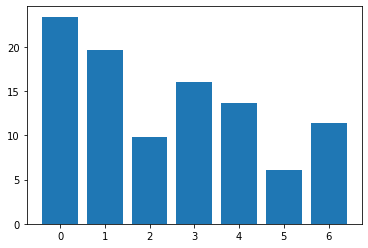

In [16]:
# fitting RF on training data
featurenames = ["ndvi", "nir_r", "sumb","r","nir","g", "reg"]
dct = fitting_rf_for_region(labdat, regim, featurenames, excl_low_imp = False, plot_importance = True) 
clf = dct["clf"]
featurenames = dct["featurenames"]

We then predict the labels for the rest of the image.

In [37]:
prlab = clf.predict(dim[featurenames]) # predicting labels for the image
prlab = prlab.reshape((msp.shape[0],msp.shape[1])) # reshaping prediction back to the image shape

Here, on the left - original image, on the right - RF predictions.

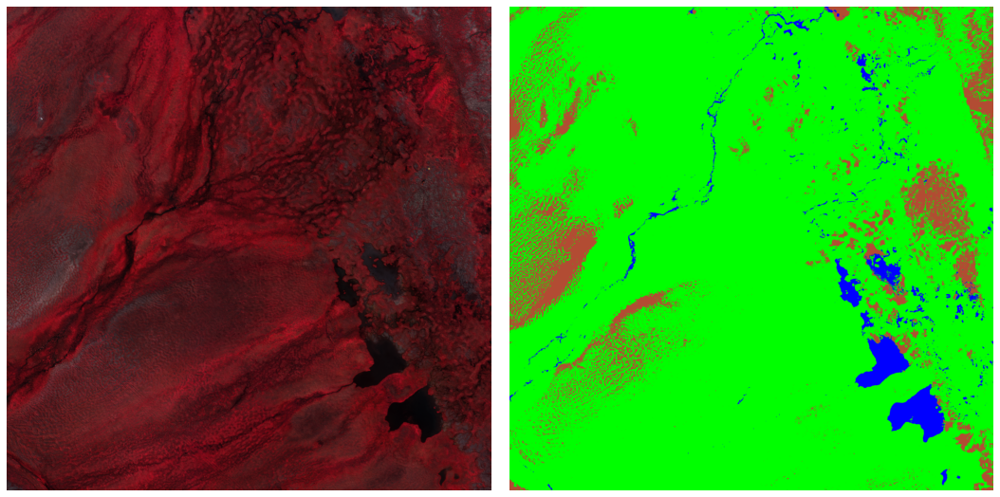

In [18]:
plot_clfres(prlab, msp3, name_im, PATH_ONE_IMAGE, save = False)

## Post-processing with superpixels

In [19]:
# threshold for taking the superpixel, 0 if there is no water
const_water = metadat.const_water.item() 
# threshold for taking the superpixel, 0 if we don't want to add superpixels
const_soil = metadat.const_soil.item()  

### 1. Separating the image into superpixels

In [20]:
img, segm, centers_norm = slic_segm(msp3, n_segments=50000, compactness = 8) # Segmenting the image
clust_segm1 = spat_segm(msp, img, segm, centers_norm, n_clust1=1000) # Clustering the superpixels

An example of the separation to superpixels id shown on the bottom-right subset of the image. 
On the left, we show the image separation to the SLIC superpixels with the average size 150-200 pix. On the right, we show superpixels clustered into 1000 non-continous clusters.

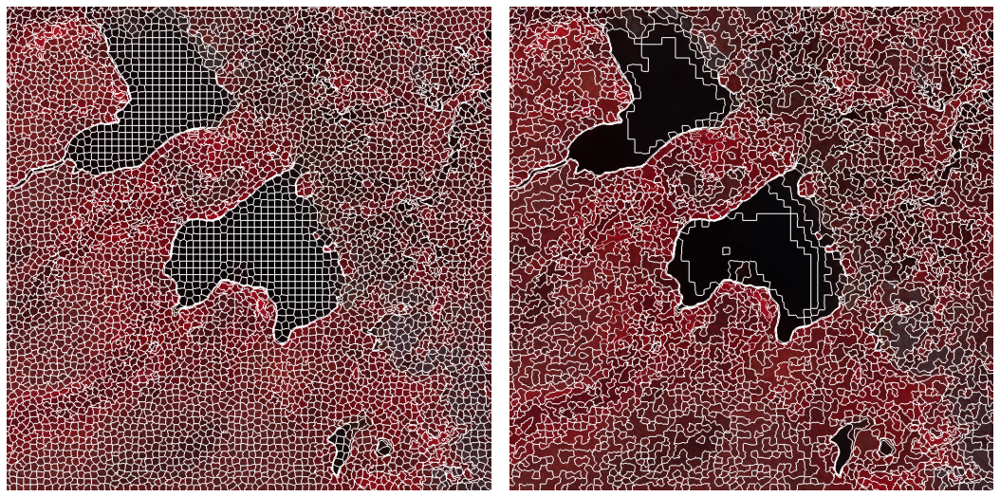

In [30]:
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, figsize=(15,30))
ax0.imshow(mark_boundaries(msp3[-1000:,-1000:,:], segm[-1000:,-1000:], color=(1,1,1)))
ax0.axis("off")
ax1.imshow(mark_boundaries(msp3[-1000:,-1000:,:], clust_segm1[-1000:,-1000:], color=(1,1,1)))
ax1.axis("off")
plt.tight_layout(pad=2)
plt.show()

### 2. Selecting water and soil clusters

We then calculate a probability that each cluster of superpixels belong to the water or soil cluster. We assign 
label "water" only to the groups of superpixels with the probability larger than pre-defined threshold *water_const*, 

In [39]:
prlab_old1 = prlab.copy()
# we replace water by superpixels, containing (fraction of water) > const_water
prlab = create_mask(prlab, clust_segm1, const_water, "water", replace = True) 

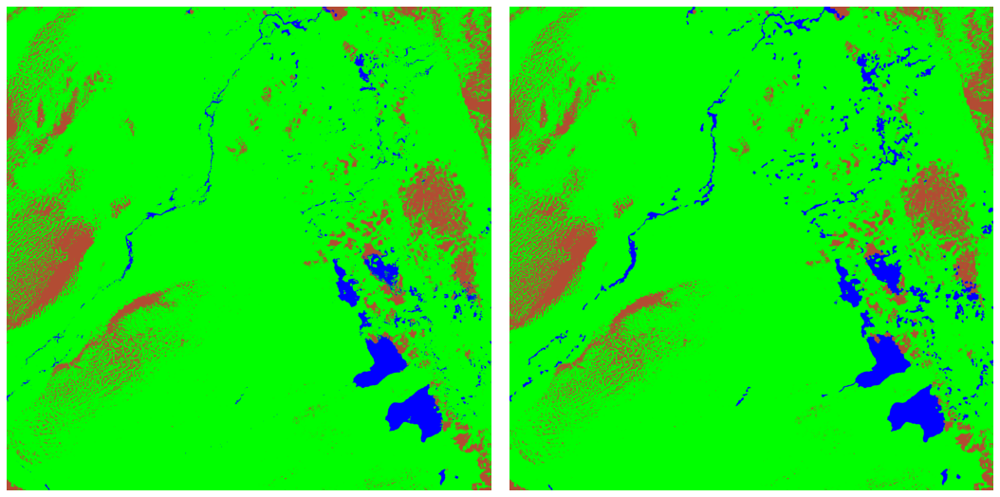

In [40]:
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, figsize=(15,30))

water_mask = prlab_old1 == "water"
veg_mask = prlab_old1 == "vegetation"
soil_mask = prlab_old1 == "soil"
masked_image = msp3.copy()
masked_image[veg_mask] = [0, 1, 0]
masked_image[water_mask] = [0, 0, 1]
masked_image[soil_mask] = [0.7, 0.3, 0.2] #[0.4, 0.3, 0.2]

ax0.imshow(masked_image)
ax0.axis("off")

water_mask = prlab == "water"
veg_mask = prlab == "vegetation"
soil_mask = prlab == "soil"
masked_image = msp3.copy()
masked_image[veg_mask] = [0, 1, 0]
masked_image[water_mask] = [0, 0, 1]
masked_image[soil_mask] = [0.7, 0.3, 0.2] #[0.4, 0.3, 0.2]
ax1.imshow(masked_image)
ax1.axis("off")


plt.tight_layout(pad=2)
plt.show()

## Saving the masks

We save and plot the final masks

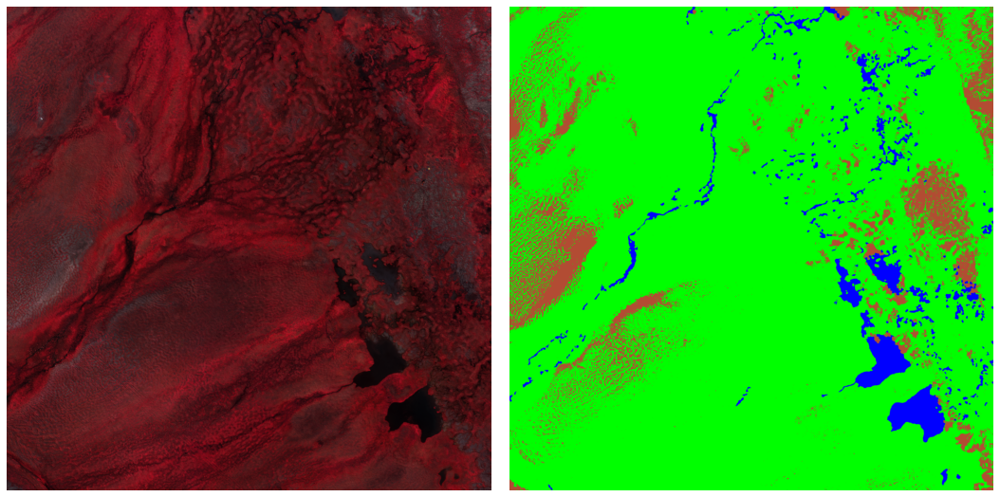

In [41]:
for maskname in ["water", "soil", "snow"]:
    if metadat[maskname].item() == 1: # if this landcover is present, save the mask
        save_mask(prlab, maskname, nam, grefiles, PATH_RESULT_MSP)
    else: # else - replace it with vegetation
        prlab[prlab == maskname] = "vegetation"

save_mask(prlab, "vegetation", nam, grefiles, PATH_RESULT_MSP)

plot_clfres(prlab, msp3, name_im, path_result = PATH_RESULT_JPG) # plotting the result and saving image